In [1]:
import os
import cv2
import numpy as np
import glob
import random
from tensorflow.lite.python.interpreter import Interpreter
import matplotlib.pyplot as plt
from matplotlib.patches import Patch  # <-- for legend

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='results', txt_only=False):

    images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.jpeg') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')
    if len(images) == 0:
        print("No images found in path:", imgpath)
        return

    with open(lblpath, 'r') as f:
        labels = [line.strip() for line in f.readlines()]

    label_colors = {
        'acne': (0, 0, 255),       # Red
        'darkspot': (0, 255, 0),   # Green
        'wrinkle': (255, 0, 0),    # Blue
        'oily': (0, 255, 255),     # Yellow
        'dry': (255, 0, 255),      # Purple
    }

    interpreter = Interpreter(model_path=modelpath)
    interpreter.allocate_tensors()

    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    height = input_details[0]['shape'][1]
    width = input_details[0]['shape'][2]
    float_input = (input_details[0]['dtype'] == np.float32)
    input_mean = 127.5
    input_std = 127.5

    num_test_images = min(num_test_images, len(images))
    images_to_test = random.sample(images, num_test_images)

    for image_path in images_to_test:
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        imH, imW, _ = image.shape
        image_resized = cv2.resize(image_rgb, (width, height))
        input_data = np.expand_dims(image_resized, axis=0)

        if float_input:
            input_data = (np.float32(input_data) - input_mean) / input_std

        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()

        boxes = interpreter.get_tensor(output_details[1]['index'])[0]
        classes = interpreter.get_tensor(output_details[3]['index'])[0]
        scores = interpreter.get_tensor(output_details[0]['index'])[0]

        detections = []

        for i in range(len(scores)):
            if scores[i] > min_conf and scores[i] <= 1.0:
                ymin = int(max(1, boxes[i][0] * imH))
                xmin = int(max(1, boxes[i][1] * imW))
                ymax = int(min(imH, boxes[i][2] * imH))
                xmax = int(min(imW, boxes[i][3] * imW))

                object_name = labels[int(classes[i])]
                color = label_colors.get(object_name, (10, 255, 0))
                cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)

                detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])

        if not txt_only:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(12, 16))
            plt.imshow(image)
            plt.axis('off')

            # Generate legend
            # Generate legend (BGR → RGB)
            legend_elements = [
                Patch(facecolor=np.array(label_colors[name][::-1]) / 255.0, label=name)  # Convert BGR to RGB
                for name in label_colors
            ]
            plt.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=3)
            plt.tight_layout()
            plt.show()

        else:
            os.makedirs(savepath, exist_ok=True)
            image_fn = os.path.basename(image_path)
            base_fn, _ = os.path.splitext(image_fn)
            txt_result_fn = base_fn + '.txt'
            txt_savepath = os.path.join(savepath, txt_result_fn)

            with open(txt_savepath, 'w') as f:
                for detection in detections:
                    f.write('%s %.4f %d %d %d %d\n' % tuple(detection))


2025-06-27 14:30:50.259740: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751009450.273760  104150 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751009450.277673  104150 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1751009450.288801  104150 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1751009450.288827  104150 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1751009450.288830  104150 computation_placer.cc:177] computation placer alr

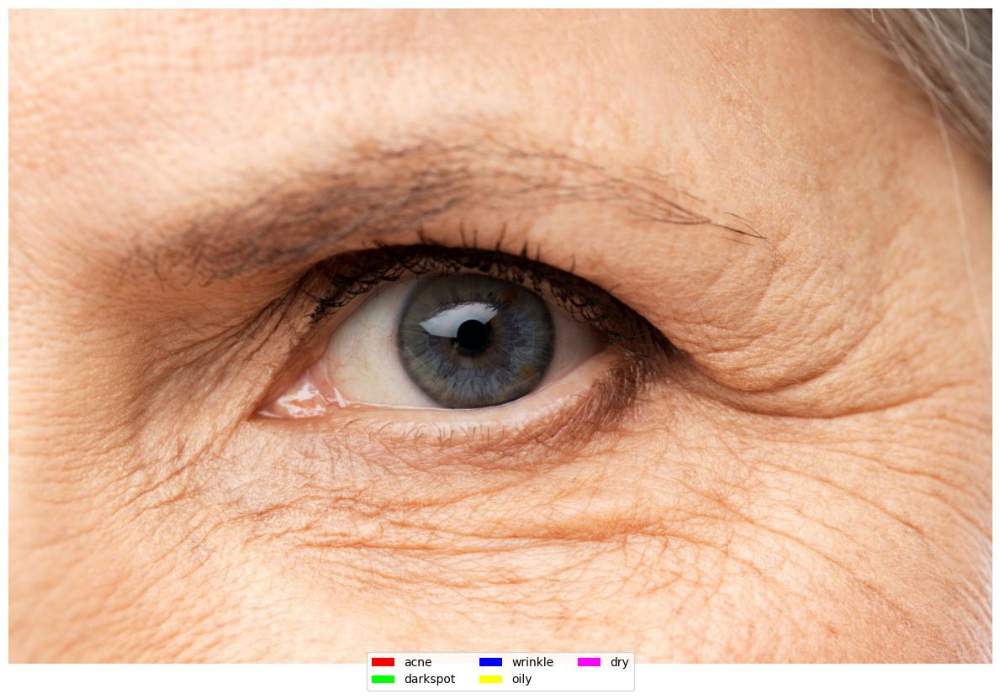

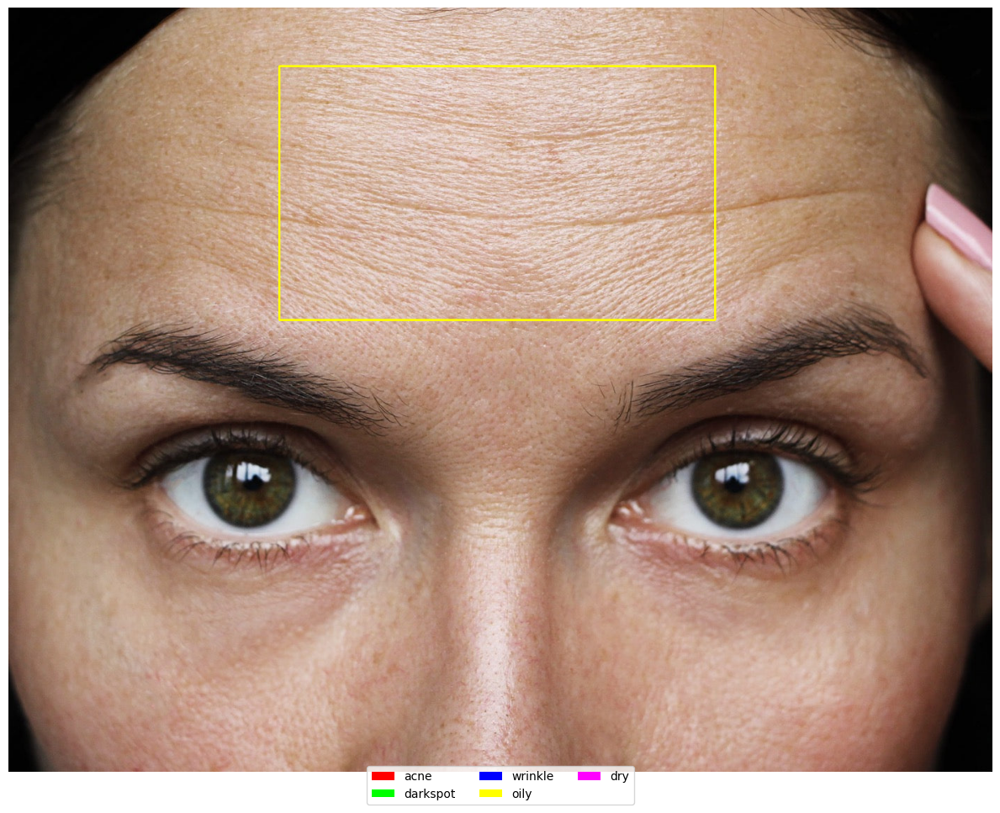

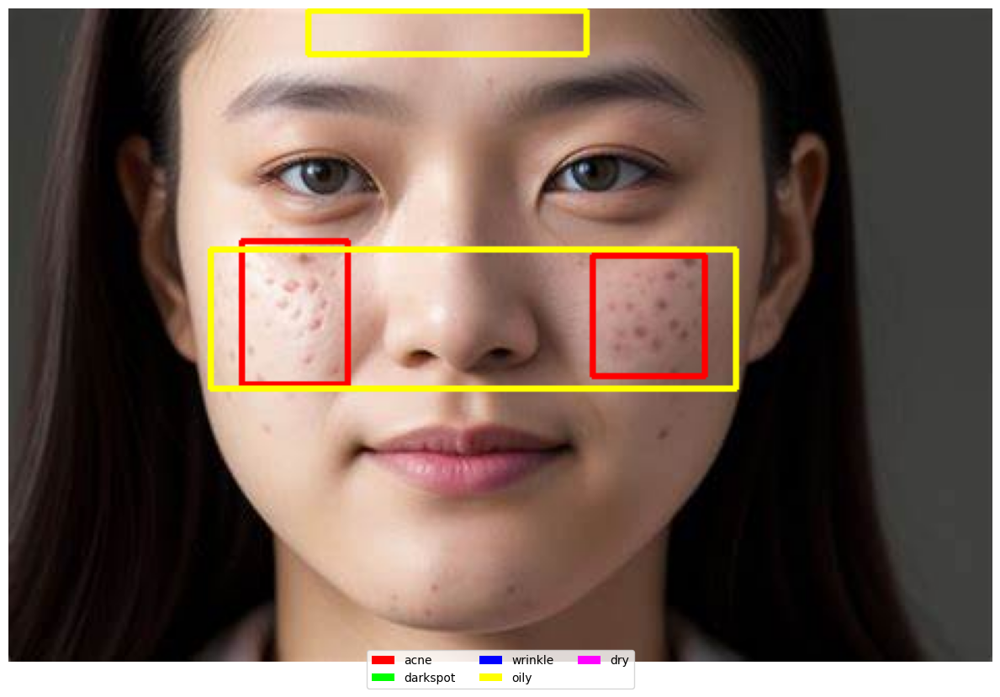

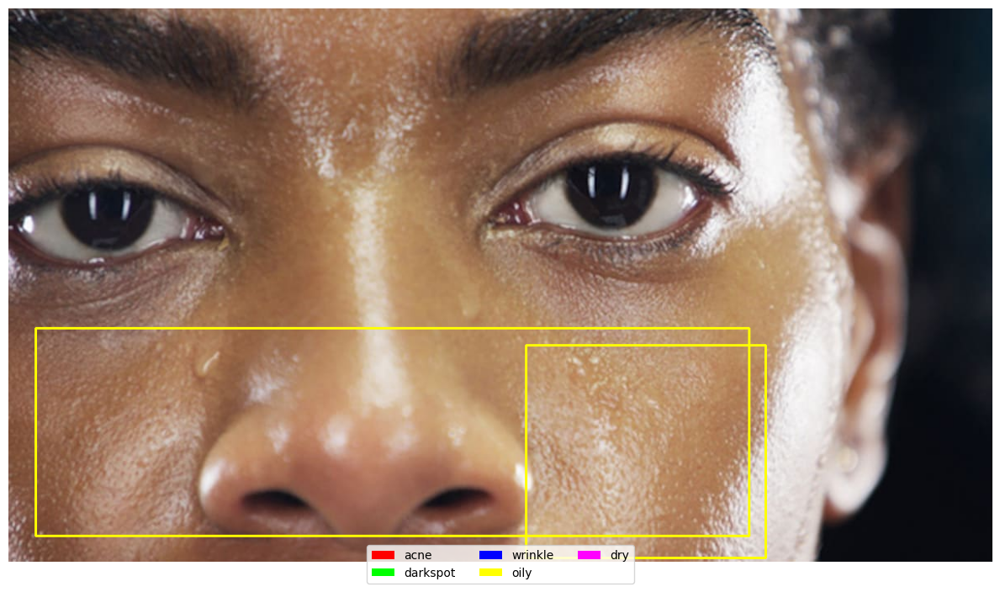

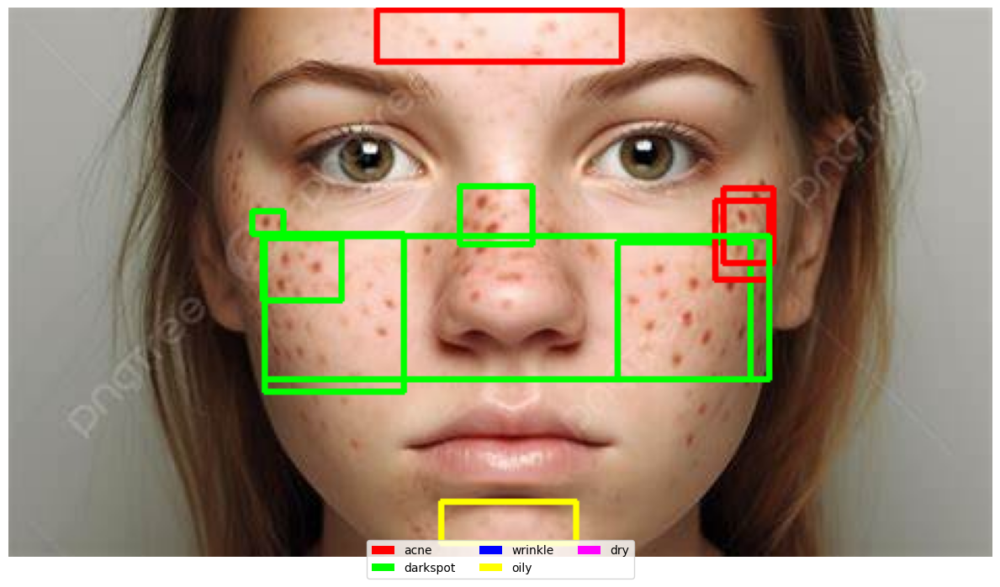

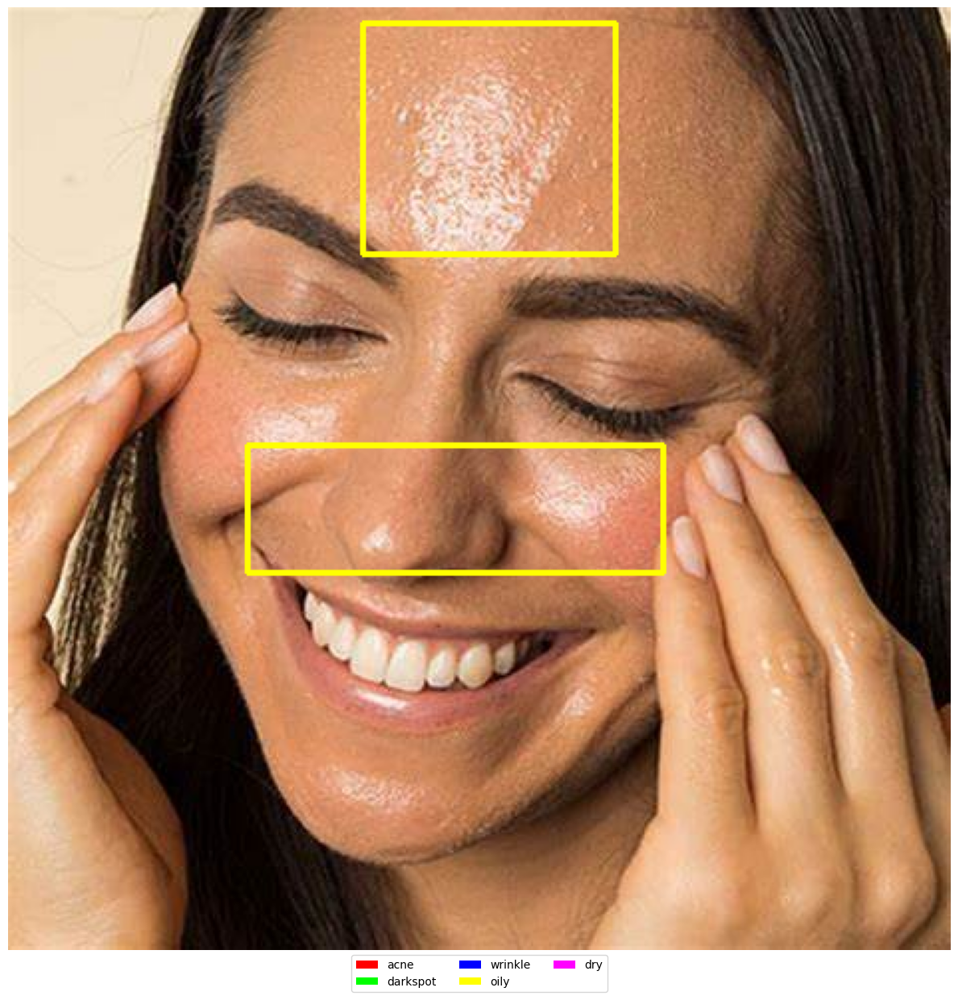

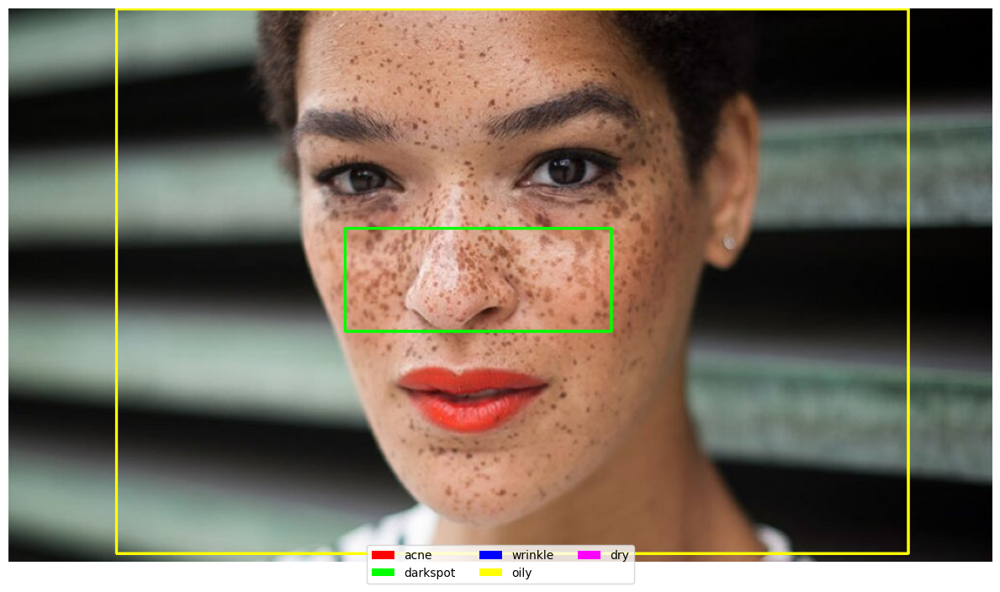

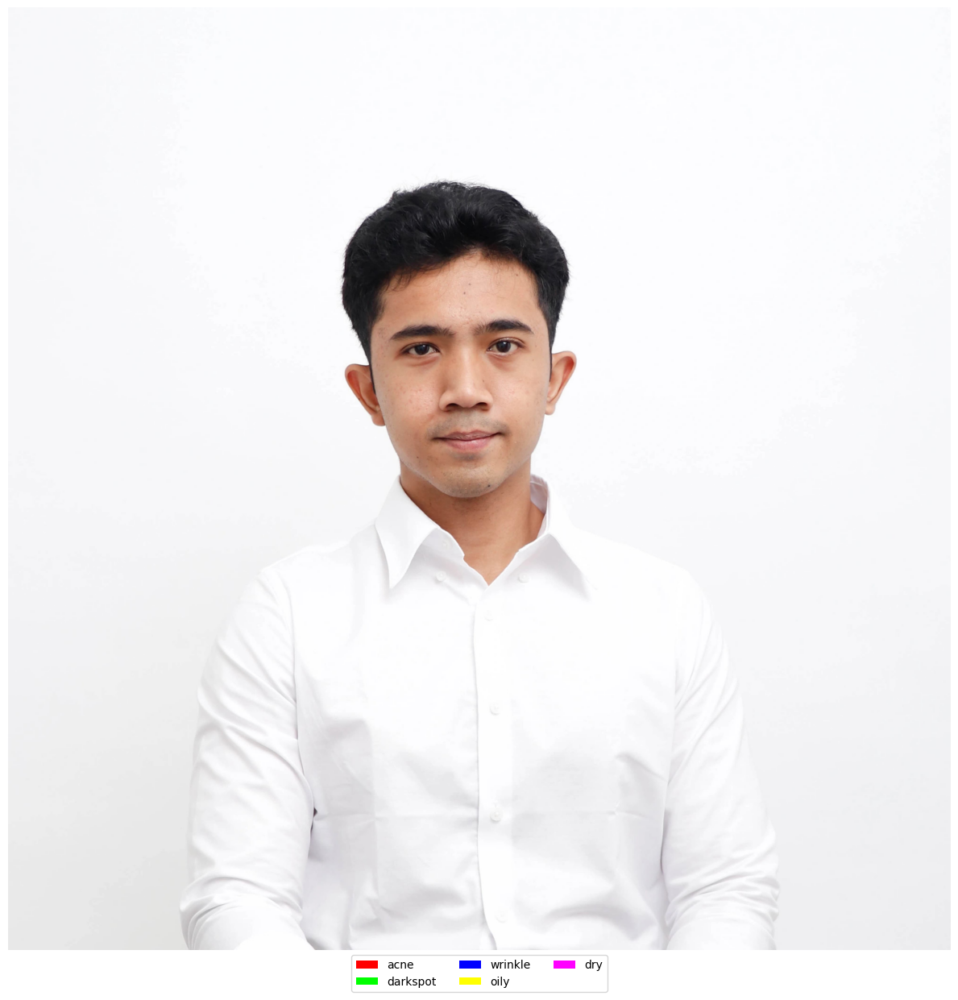

In [6]:
# Set up variables for running user's model
PATH_TO_IMAGES='test_detection'   # Path to test images folder
PATH_TO_MODEL='detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='dataset_object_detection/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold= 0.2 #0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 8   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)